# This notebook illustrates how to migrate annotations to visium spot space in the form of an AnnData object

In this notebook, we will load the TissueTag annotated image of a visium H&E reference image. 
Then we will translate the pixel level annotations to an hexagonal binned grid and measure the minimal euclidean distances to the annotations and calculate 2 types of biological axes(OrganAxis). Finally we will migrate annotations to visium space and print some plots.

In [1]:
import os
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import tissue_tag as tt
import scanpy as sc 


In [2]:
# set path
path_to_tissue_tag =  # path to tissue tag main folder (e.g. c:/Users/John/Downloads/TissueTag)
path = path_to_tissue_tag + '/data/tissue_tag_minimal_example_visium/' 

## load and transfer annotations to grid space

This loads your annotations once you are done and collapses the annotation 
to a hex grid with spots `spot_diameter` microns wide. This carries a number of advantages:

 - not needing to calculate things on a pixel level is more computationally tractable
 - overcomes potential issues of uneven data density
 - ensures consistent resolution for spatial measurements regardless of the resolution of the image

Providing the PPM values of the downsampled and original image in reverse recreates the coordinates in the original dimensions.

In [3]:
# load tissue annotations from TissueTag and migrate annotation to a 15um hexagonal grid and outputs the coordinates in ppm=1 
df_anno = tt.anno_to_grid(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotations size - (3957, 3886)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations


273504it [02:46, 1641.80it/s]


In [4]:
# here we calculate the relative distances of each spot in the grid to the closest corresponding spot from all annotations
print('calculating distances')
tt.dist2cluster_fast(
    df=df_anno,
    annotation='annotations',
    KNN=5
    ) # calculate minimum median distance of each spot to clusters with KNN

calculating distances
calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
HS
Medulla
Other
PVS
Vessels
unassigned


{'Artifacts': array([2163.51456915, 2155.39527842, 2147.34311902, ..., 1583.94235588,
        1596.52442436, 1609.14677496]),
 'Cortex': array([2137.67851471, 2128.05620386, 2118.4956622 , ..., 1721.48206114,
        1733.75037479, 1745.97129963]),
 'Edge': array([2073.72979397, 2063.76520704, 2053.56182816, ..., 1887.35997213,
        1901.56042442, 1915.77198084]),
 'HS': array([2630.92859259, 2622.51041289, 2614.15073869, ..., 1918.20538162,
        1931.86632099, 1945.54593174]),
 'Medulla': array([2534.83592291, 2525.051865  , 2515.31872526, ..., 1728.90376504,
        1741.29913023, 1753.73408536]),
 'Other': array([3680.79694865, 3667.51166479, 3654.23932749, ..., 2538.34339953,
        2550.67505102, 2563.03429297]),
 'PVS': array([2480.29071283, 2470.67093148, 2461.10448646, ..., 2335.28620166,
        2344.1056332 , 2352.98683931]),
 'Vessels': array([6767.52258769, 6755.68293444, 6743.85568198, ..., 4308.36678613,
        4316.80530509, 4325.27882904]),
 'unassigned': array(

Calculate morphological axes 

In [6]:
# axis calculations based on 3 landmarks  - this axis is good to capture the entire thymus spatial variability 
anno = 'annotations'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_anno = tt.calculate_axis_3p(df_anno, anno=anno, structure=structure, output_col='cma_3p', w=w)

# axis calculations based on 2 landmarks - this axis is good to capture the location within the cortex
anno = 'annotations'
structure = ['Edge','Medulla']
df_anno = tt.calculate_axis_2p(df_anno, anno=anno, structure=structure, output_col='cma_2p')

In [7]:
df_anno = df_anno[df_anno['annotations']!='unassigned']
df_anno

,x,y,annotations,annotations_number,L2_dist_annotations_Artifacts,L2_dist_annotations_Cortex,L2_dist_annotations_Edge,L2_dist_annotations_HS,L2_dist_annotations_Medulla,L2_dist_annotations_Other,L2_dist_annotations_PVS,L2_dist_annotations_Vessels,L2_dist_annotations_unassigned,cma_3p,cma_2p
index,,,,,,,,,,,,,,,
8672,494.193787,3366.073975,Edge,5,1981.473530,102.518494,15.091742,1676.949030,1324.763366,1212.169491,1685.176089,4166.043091,20.464232,-0.833748,-0.977473
8673,494.193787,3381.034180,Edge,5,1972.604194,99.290135,12.688734,1666.414022,1313.514329,1213.111311,1691.009817,4158.800551,23.456314,-0.842229,-0.980865
8674,494.193787,3395.994385,Edge,5,1963.737813,96.236546,12.688685,1655.798141,1302.275368,1214.236665,1696.955374,4151.599281,23.462114,-0.843302,-0.980701
8675,494.193787,3410.954346,Edge,5,1954.874549,93.430960,12.688664,1645.249314,1291.021714,1215.545021,1703.011490,4144.439614,23.462092,-0.844195,-0.980535
8676,494.193787,3425.914551,Edge,5,1946.014131,92.284011,12.688734,1634.768465,1279.843732,1217.035830,1709.177186,4137.321531,23.462114,-0.844040,-0.980366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262818,7158.007812,6036.480957,Edge,5,78.760184,34.617118,12.670759,206.496460,68.409668,863.810428,1338.596874,3014.363919,36.315067,-0.355218,-0.687452
262819,7158.007812,6051.441406,Edge,5,64.968984,40.805307,12.670715,200.455224,70.817587,869.498229,1335.249749,3017.399211,36.314998,-0.320321,-0.696467
262820,7158.007812,6066.401367,Edge,5,51.586431,43.435866,12.670618,195.374634,75.988364,875.399749,1332.062315,3020.505446,35.899906,-0.327730,-0.714172


generate continuous annotations, note that there is a large dependacy of the KNN number you select, you might want to map different annotations to different KNN resolutions 

Now we can use the hex grid to project back our annotation to the visium spot level. We do this by each spot nearest neighbours in the grid space and take it's annotation. There is a `max_distance` parameter that limits how far away a grid space entry can be from a spot to count as a KNN, in the interest of avoiding annotation artifacts.

The function also creates some simple diagnostic plots of the provided coordinates, allowing for sanity checking that nothing has gone wrong (e.g. axis flips or accidental resolution mismatches).

The output is a data frame that adds the inferred annotation for each spot. `annotations_number` essentially duplicates the information from `annotations`, but in integer form.

Make sure the coordinate systems are aligned, e.g., axes are not flipped and the resolution is matched.


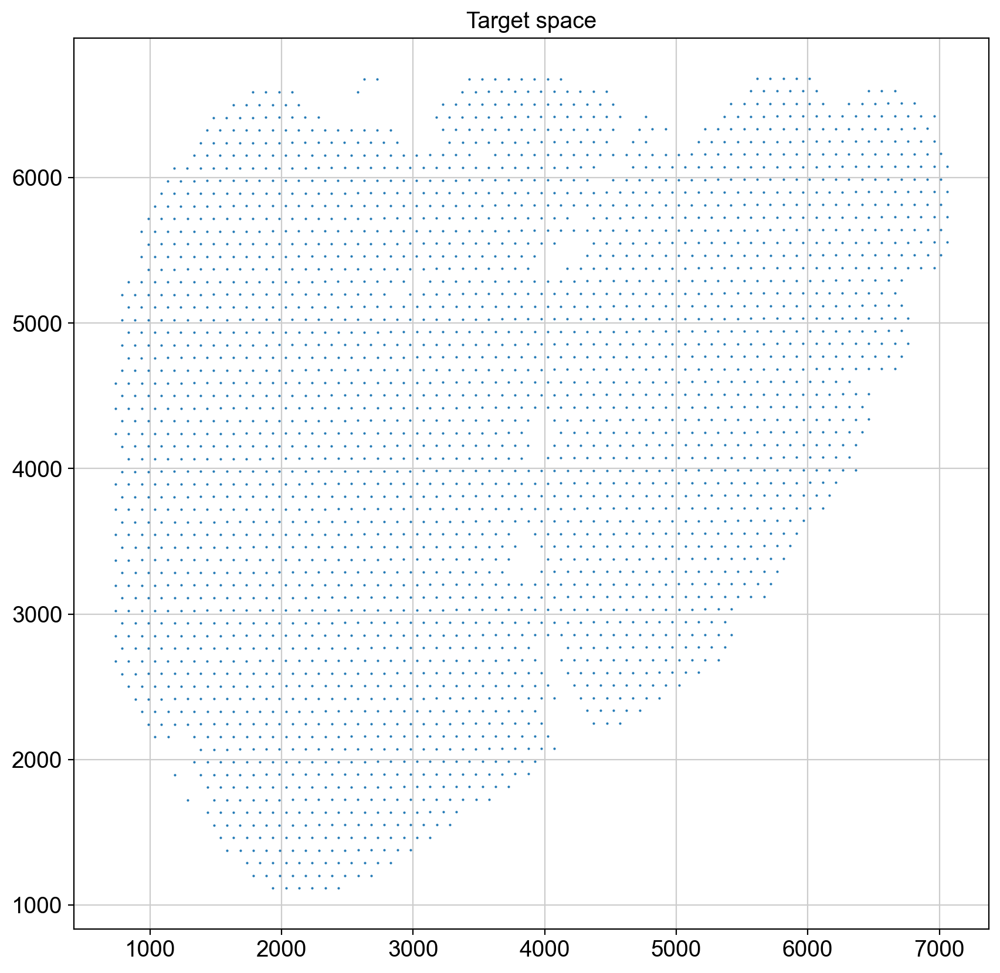

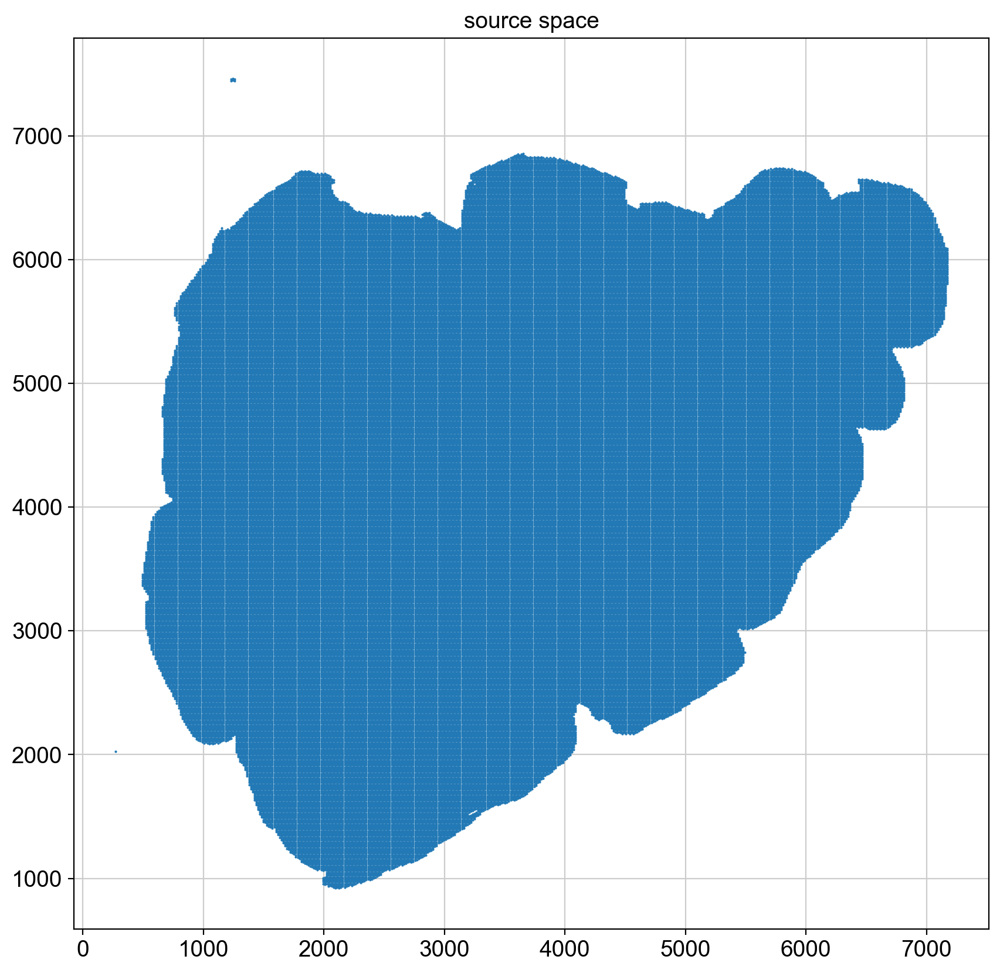

Migrating source annotation - annotations to target space.
Migrating source annotation - annotations_number to target space.
Migrating source annotation - L2_dist_annotations_Artifacts to target space.
Migrating source annotation - L2_dist_annotations_Cortex to target space.
Migrating source annotation - L2_dist_annotations_Edge to target space.
Migrating source annotation - L2_dist_annotations_HS to target space.
Migrating source annotation - L2_dist_annotations_Medulla to target space.
Migrating source annotation - L2_dist_annotations_Other to target space.
Migrating source annotation - L2_dist_annotations_PVS to target space.
Migrating source annotation - L2_dist_annotations_Vessels to target space.
Migrating source annotation - L2_dist_annotations_unassigned to target space.
Migrating source annotation - cma_3p to target space.
Migrating source annotation - cma_2p to target space.


,1,2,3,4,5,pxl_row_in_fullres,pxl_col_in_fullres,x,y,annotations,...,L2_dist_annotations_Cortex,L2_dist_annotations_Edge,L2_dist_annotations_HS,L2_dist_annotations_Medulla,L2_dist_annotations_Other,L2_dist_annotations_PVS,L2_dist_annotations_Vessels,L2_dist_annotations_unassigned,cma_3p,cma_2p
0,,,,,,,,,,,,,,,,,,,,,
GTATTCTTACCGTGCT-1,1.0,7.0,21.0,2648.165623,3936.403490,1201.223867,1785.576318,446.394080,300.305967,Edge,...,37.603203,12.670669,505.785915,458.796390,2088.319082,437.045456,4800.571000,41.293378,-0.777984,-0.946250
GCGGTAACCCAAATGA-1,1.0,7.0,23.0,2648.624365,4155.922017,1201.431955,1885.151243,471.287811,300.357989,Cortex,...,12.670658,66.074944,421.335405,380.283122,2087.231233,410.515521,4743.174889,108.641954,-0.612771,-0.703937
CTACGTGTTGCCACCA-1,1.0,6.0,24.0,2457.353859,4265.806292,1114.670502,1934.995412,483.748853,278.667626,Cortex,...,15.087298,20.468655,456.259816,415.108441,2173.418387,490.775938,4794.759288,58.714060,-0.713617,-0.906016
CTAGATAAACTCCTCG-1,1.0,7.0,25.0,2649.083106,4375.440543,1201.640043,1984.726168,496.181542,300.410011,Cortex,...,12.670669,94.967695,360.876622,319.768665,2106.287319,413.176891,4700.779686,143.722185,-0.586103,-0.542033
TCCATTAGTTGGATAG-1,1.0,6.0,26.0,2457.812601,4485.324818,1114.878590,2034.570337,508.642584,278.719648,Artifacts,...,27.445756,37.741327,413.800425,364.558917,2194.120531,491.507828,4753.774898,80.904366,-0.656390,-0.812372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTTGATGACCATCCAG-1,1.0,70.0,98.0,14730.319376,12379.991026,6681.761537,5615.638450,1403.909612,1670.440384,Edge,...,40.351792,13.038148,358.918580,148.117029,635.080489,309.823531,1882.147413,27.410969,-0.559752,-0.838191
CTTGCCCACCCACGCA-1,1.0,70.0,100.0,14730.778118,12599.509552,6681.969625,5715.213375,1428.803344,1670.492406,Cortex,...,15.087288,23.111195,344.446853,116.714431,718.303185,228.252175,1957.748177,66.728869,-0.574837,-0.669428
GGACAACCATGAAGCC-1,1.0,70.0,102.0,14731.236859,12819.028079,6682.177713,5814.788300,1453.697075,1670.544428,Artifacts,...,26.469398,39.025140,363.045696,95.961496,796.132217,184.271149,2028.494889,72.036921,-0.415741,-0.421793


In [15]:
# read visium info
_,ppm_vis,vis_df = tt.read_visium(spaceranger_dir_path=path+'/',res_in_ppm=0.25,plot=False)
vis_df.rename(columns={'pxl_col': "x", 'pxl_row': "y"},inplace=True) # for new spaceranger 
vis_df = tt.map_annotations_to_target(                            
    df_target=vis_df,  
    df_source=df_anno,
    ppm_target= ppm_vis,
    plot=True,
)
vis_df

In [12]:
# read visium full data 
adata_vis = sc.read_visium(path,count_file='raw_feature_bc_matrix.h5')
# map annotations 
adata_vis.obs = pd.concat([adata_vis.obs,vis_df.iloc[:,2:]],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
adata_vis

c:\Users\nyayon\Anaconda3\envs\tissuetag\lib\site-packages\anndata\_core\anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 3, 4, 5, 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'x', 'y', 'annotations', 'annotations_number', 'L2_dist_annotations_Artifacts', 'L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'L2_dist_annotations_Other', 'L2_dist_annotations_PVS', 'L2_dist_annotations_Vessels', 'L2_dist_annotations_unassigned', 'cma_3p', 'cma_2p'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

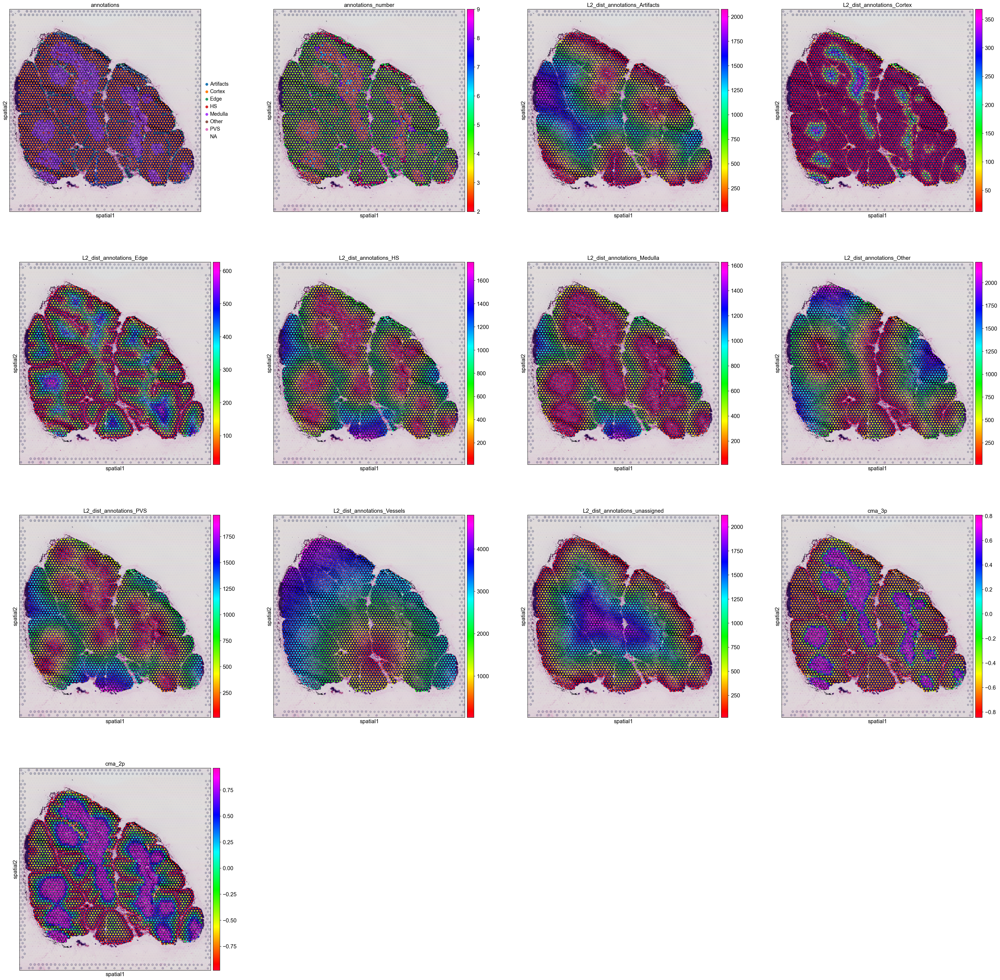

In [16]:
# plot the newly annotated visium AnnData
sc.set_figure_params(figsize=[10,10])
sc.pl.spatial(adata_vis,color=adata_vis.obs.columns[10:],cmap='gist_rainbow',ncols=4)

In [17]:
#done!